# Travelling Salesman Problem using Genetic Algorithm

### Importing Libraries

In [507]:
import matplotlib.pyplot as plt
from itertools import permutations, combinations
from random import shuffle
import random
import numpy as np
import statistics
import pandas as pd
import seaborn as sns

## Data

### Cities Coordinates and Algorithm Parameters

In [508]:
x = [0,3,6,7,15,10,16,5,8,1.5]
y = [1,2,1,4.5,-1,2.5,11,6,9,12]
cities_names = ["Gliwice", "Cairo", "Rome", "Krakow", "Paris", "Alexandria", "Berlin", "Tokyo", "Rio", "Budapest"]
city_coords = dict(zip(cities_names, zip(x, y)))
n_population = 250
crossover_per = 0.8
mutation_per = 0.2
n_generations = 200

## Visualising Cities

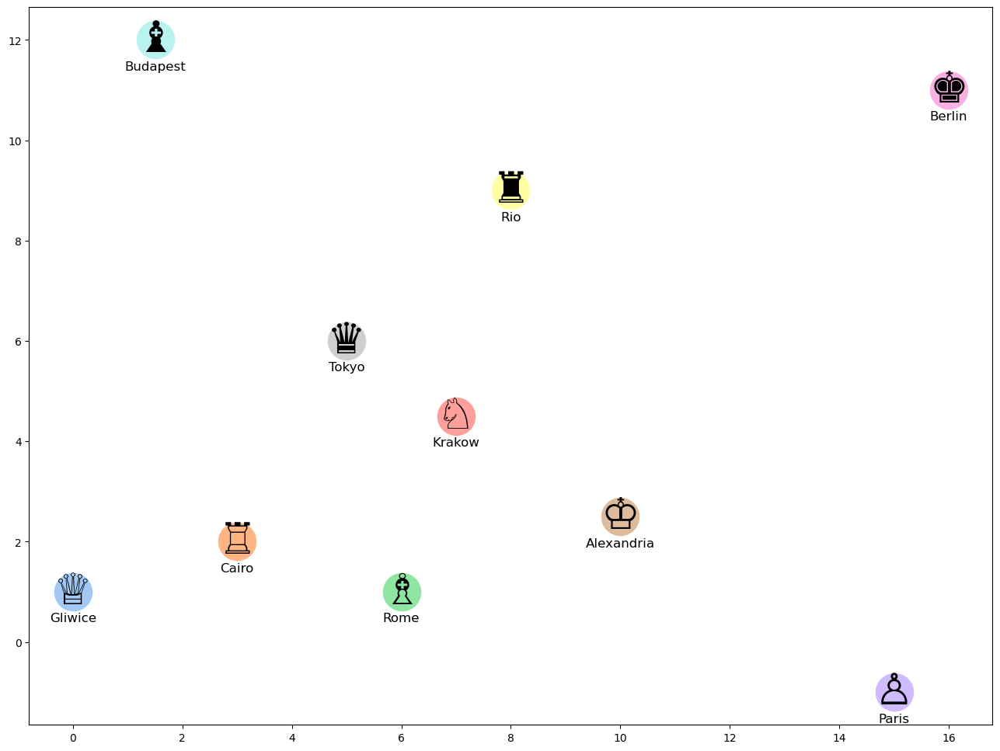

In [509]:
# Pastel Pallete
colors = sns.color_palette("pastel", len(cities_names))

# City Icons
city_icons = {
    "Gliwice": "♕",
    "Cairo": "♖",
    "Rome": "♗",
    "Krakow": "♘",
    "Paris": "♙",
    "Alexandria": "♔",
    "Berlin": "♚",
    "Tokyo": "♛",
    "Rio": "♜",
    "Budapest": "♝"
}

fig, ax = plt.subplots()

ax.grid(False)  # Grid

for i, (city, (city_x, city_y)) in enumerate(city_coords.items()):
    color = colors[i]
    icon = city_icons[city]
    ax.scatter(city_x, city_y, c=[color], s=1200, zorder=2)
    ax.annotate(icon, (city_x, city_y), fontsize=40, ha='center', va='center', zorder=3)
    ax.annotate(city, (city_x, city_y), fontsize=12, ha='center', va='bottom', xytext=(0, -30),
                textcoords='offset points')

fig.set_size_inches(16, 12)
plt.show()

## Population Function (Random Initialization)

In [510]:
from enum import Enum

class Block_type(Enum):
  LEFT = 0
  UP = 1
  RIGTH = 2
  DOWN = 3


In [511]:
def initial_population(cities_list, n_population = 250):
    
    """
    Generating initial population of cities randomly selected from the all possible permutations 
    of the given cities. 
    Input:
    1- Cities list 
    2- Number of population 
    Output:
    Generated lists of cities
    """
    
    population_perms = []
    possible_perms = list(permutations(cities_list))
    random_ids = random.sample(range(0,len(possible_perms)),n_population)
    
    for i in random_ids:
        population_perms.append(list(possible_perms[i]))
        
    return population_perms

## Distance between two cities

In [512]:
def euclidean_dist(point1, point2):
  return np.sqrt((point2[0] - point1[0])**2 + (point2[1] - point1[1])**2)

In [513]:
def dist_road2cities(road_coords: list):
    from functools import partial

    total_dist = 0

    for name, city_point in city_coords.items():
      dist_f = partial(euclidean_dist, city_point)
      total_dist += min(dist_f(el) for el in road_coords)


    return total_dist

## Total distance traveled by individual 

In [514]:
def generate_road(blocks_pool: dict):
  road = []
  for (block_type, length), number in blocks_pool.items():
    road.extend([(block_type, length)] * number)

  random.shuffle(road)

  return road


In [515]:
def block_type2dx_dy(block_type: Block_type, length: float)->tuple[float, float]:
  if block_type is Block_type.LEFT: return (-length, 0)
  if block_type is Block_type.RIGTH: return (length, 0)
  if block_type is Block_type.UP: return (0, length)
  if block_type is Block_type.DOWN: return (0, -length)

In [516]:
def generate_blocks_pool(n: int):
  pool = {}
  for i in range(n):
    block_type = random.choice(list(Block_type))
    pool[(block_type, 1)] = pool.get((block_type, 1), 0) + 1

  return pool

In [517]:
def total_dist_individual(individual):
    
    """
    Calculating the total distance traveled by individual, 
    one individual means one possible solution (1 permutation)
    Input:
    1- Individual list of cities 
    Output:
    Total distance traveled 
    """
    blocks_pool = generate_blocks_pool(100)
    
    road = generate_road(blocks_pool)
    road_coords = []
    curr_coord = (0, 0)
    for dx, dy in (block_type2dx_dy(*el) for el in road):
      curr_coord = (curr_coord[0] + dx, curr_coord[1] + dy)
      road_coords.append(curr_coord)
    print(road_coords)
    return dist_road2cities(road_coords)

## Fitness probability function

In [518]:
def fitness_prob(population):
    """
    Calculating the fitness probability 
    Input:
    1- Population  
    Output:
    Population fitness probability 
    """
    total_dist_all_individuals = []
    for i in range(0, len(population)):
        total_dist_all_individuals.append(total_dist_individual(population[i]))
        
    min_population_dist = min(total_dist_all_individuals)
    population_fitness = min_population_dist - total_dist_all_individuals
    population_fitness_sum = sum(population_fitness)
    population_fitness_probs = population_fitness / population_fitness_sum
    return population_fitness_probs

## Roulette wheel

In [519]:
def roulette_wheel(population, fitness_probs):
    """
    Implement selection strategy based on roulette wheel proportionate selection. 
    Input:
    1- population
    2- fitness probabilities 
    Output:
    selected individual
    """
    population_fitness_probs_cumsum = fitness_probs.cumsum()
    bool_prob_array = population_fitness_probs_cumsum < np.random.uniform(0,1,1)
    selected_individual_index = len(bool_prob_array[bool_prob_array == True]) - 1
    return population[selected_individual_index]

## Crossover

In [520]:
def crossover(parent_1, parent_2):
    """
    Implement mating strategy using simple crossover between 2 parents
    Input:
    1- parent 1
    2- parent 2 
    Output:
    1- offspring 1
    2- offspring 2
    """
    n_cities_cut = len(cities_names) - 1
    cut = round(random.uniform(1, n_cities_cut))
    offspring_1 = []
    offspring_2 = []
    
    offspring_1 = parent_1[0:cut]
    offspring_1 += [city for city in parent_2 if city not in offspring_1]
    
    
    offspring_2 = parent_2[0:cut]
    offspring_2 += [city for city in parent_1 if city not in offspring_2]
    
    
    return offspring_1, offspring_2
    

## Mutation

In [521]:
def mutation(offspring):
    """
    Implement mutation strategy in a single offspring
    Input:
    1- offspring individual
    Output:
    1- mutated offspring individual
    """
    n_cities_cut = len(cities_names) - 1
    index_1 = round(random.uniform(0,n_cities_cut))
    index_2 = round(random.uniform(0,n_cities_cut))

    temp = offspring[index_1]
    offspring[index_1] = offspring[index_2]
    offspring[index_2] = temp
    return(offspring)
    

## Algorithm

1. Implement the described GA algorithm to solve the traveling salesman problem.
Use a map of cities provided e.g. N = 10 and the GA parameters:
P = 250, n = 0.8, p m = 0.2, T max = 1000. What was the minimal total distance
traveled? What is the sequence of cities to be visited ensuring the minimal
total distance traveled?
2. Investigation the influence of parameters P, n and p m on the mean minimal total
distance traveled calculated for 10 trials. Change the values of P within a set
{100, 300, 500}, n ∈ {0.5, 0.7, 0.9} and p m ∈ {0.1, 0.3, 0.5}.

In [522]:
def run_ga(cities_names, n_population, n_generations, crossover_per, mutation_per):
    
    population = initial_population(cities_names, n_population)
    fitness_probs = fitness_prob(population)
    
    parents_list = []
    for i in range(0, int(crossover_per * n_population)):
        parents_list.append(roulette_wheel(population, fitness_probs))

    offspring_list = []    
    for i in range(0,len(parents_list), 2):
        offspring_1, offspring_2 = crossover(parents_list[i], parents_list[i+1])

    #     print(offspring_1)
    #     print(offspring_2)
    #     print()

        mutate_threashold = random.random()
        if(mutate_threashold > (1-mutation_per)):
            offspring_1 = mutation(offspring_1)
    #         print("Offspring 1 mutated", offspring_1)

        mutate_threashold = random.random()
        if(mutate_threashold > (1-mutation_per)):
            offspring_2 = mutation(offspring_2)
    #         print("Offspring 2 mutated", offspring_2)


        offspring_list.append(offspring_1)
        offspring_list.append(offspring_2)

    mixed_offspring = parents_list + offspring_list

    fitness_probs = fitness_prob(mixed_offspring)
    sorted_fitness_indices = np.argsort(fitness_probs)[::-1]
    best_fitness_indices = sorted_fitness_indices[0:n_population]
    best_mixed_offsrping = []
    for i in best_fitness_indices:
        best_mixed_offsrping.append(mixed_offspring[i])
        


    for i in range(0, n_generations):
        # if (i%10 == 0):
            # print("Generation: ", i)
        
        fitness_probs = fitness_prob(best_mixed_offsrping)
        parents_list = []
        for i in range(0, int(crossover_per * n_population)):
            parents_list.append(roulette_wheel(best_mixed_offsrping, fitness_probs))

        offspring_list = []    
        for i in range(0,len(parents_list), 2):
            offspring_1, offspring_2 = crossover(parents_list[i], parents_list[i+1])

            mutate_threashold = random.random()
            if(mutate_threashold > (1-mutation_per)):
                offspring_1 = mutation(offspring_1)

            mutate_threashold = random.random()
            if(mutate_threashold > (1-mutation_per)):
                offspring_2 = mutation(offspring_2)

            offspring_list.append(offspring_1)
            offspring_list.append(offspring_2)


        mixed_offspring = parents_list + offspring_list
        fitness_probs = fitness_prob(mixed_offspring)
        sorted_fitness_indices = np.argsort(fitness_probs)[::-1]
        best_fitness_indices = sorted_fitness_indices[0:int(0.8*n_population)]

        best_mixed_offsrping = []
        for i in best_fitness_indices:
            best_mixed_offsrping.append(mixed_offspring[i])
            
        old_population_indices = [random.randint(0, (n_population - 1)) for j in range(int(0.2*n_population))]
        for i in old_population_indices:
#             print(i)
            best_mixed_offsrping.append(population[i])
            
        random.shuffle(best_mixed_offsrping)
            
    return best_mixed_offsrping

In [523]:
best_mixed_offsrping = run_ga(cities_names, n_population, n_generations, crossover_per, mutation_per)

[(1, 0), (2, 0), (1, 0), (1, -1), (2, -1), (2, 0), (3, 0), (4, 0), (4, 1), (4, 0), (4, 1), (4, 0), (3, 0), (3, -1), (3, 0), (4, 0), (5, 0), (5, -1), (5, -2), (6, -2), (5, -2), (5, -1), (5, 0), (4, 0), (3, 0), (3, 1), (3, 2), (3, 3), (2, 3), (3, 3), (3, 2), (3, 3), (3, 4), (2, 4), (2, 5), (1, 5), (2, 5), (1, 5), (1, 4), (0, 4), (-1, 4), (-2, 4), (-2, 3), (-1, 3), (-1, 2), (0, 2), (1, 2), (2, 2), (2, 1), (1, 1), (1, 2), (2, 2), (3, 2), (2, 2), (2, 1), (3, 1), (2, 1), (3, 1), (3, 2), (4, 2), (3, 2), (3, 3), (3, 4), (3, 5), (4, 5), (3, 5), (3, 6), (2, 6), (3, 6), (4, 6), (4, 7), (3, 7), (2, 7), (1, 7), (0, 7), (-1, 7), (0, 7), (1, 7), (1, 8), (1, 9), (0, 9), (0, 10), (-1, 10), (-2, 10), (-1, 10), (0, 10), (-1, 10), (-1, 11), (-1, 12), (-2, 12), (-2, 13), (-3, 13), (-4, 13), (-4, 14), (-5, 14), (-5, 13), (-5, 12), (-5, 13), (-5, 14), (-5, 13)]
[(-1, 0), (-1, -1), (-1, -2), (0, -2), (0, -3), (-1, -3), (0, -3), (1, -3), (1, -4), (1, -5), (2, -5), (1, -5), (0, -5), (-1, -5), (-2, -5), (-2, -4)

KeyboardInterrupt: 

In [ ]:
total_dist_all_individuals = []
for i in range(0, n_population):
    total_dist_all_individuals.append(total_dist_individual(best_mixed_offsrping[i]))

In [ ]:
index_minimum = np.argmin(total_dist_all_individuals)

### Optimum Solution

In [ ]:
minimum_distance = min(total_dist_all_individuals)

In [ ]:
minimum_distance

0.0

#### Optimum Solution is the distance of 61.137

In [ ]:
# shortest_path = offspring_list[index_minimum]
shortest_path = best_mixed_offsrping[index_minimum]

In [ ]:
shortest_path

['Krakow',
 'Berlin',
 'Cairo',
 'Tokyo',
 'Paris',
 'Budapest',
 'Rome',
 'Gliwice',
 'Alexandria',
 'Rio']

### Optimum Solution Visualization

In [ ]:
x_shortest = []
y_shortest = []
for city in shortest_path:
    x_value, y_value = city_coords[city]
    x_shortest.append(x_value)
    y_shortest.append(y_value)
    
x_shortest.append(x_shortest[0])
y_shortest.append(y_shortest[0])

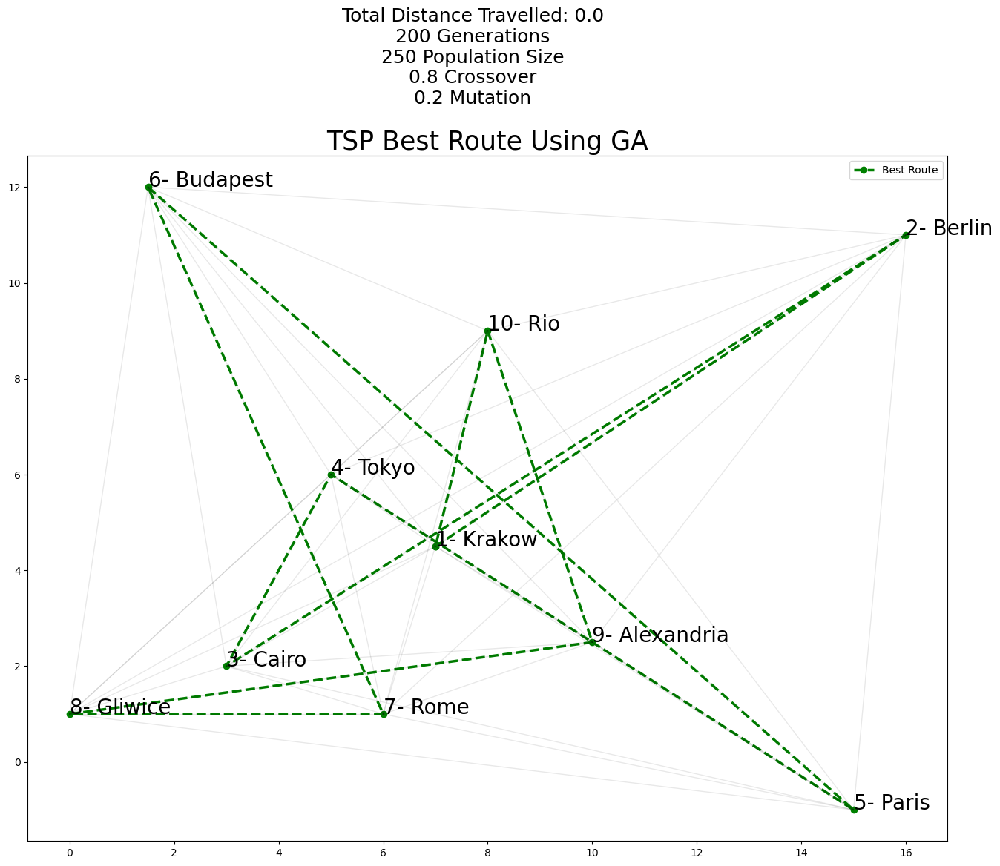

In [ ]:
fig, ax = plt.subplots()
ax.plot(x_shortest, y_shortest, '--go', label='Best Route', linewidth=2.5)
plt.legend()

for i in range(len(x)):
    for j in range(i + 1, len(x)):
        ax.plot([x[i], x[j]], [y[i], y[j]], 'k-', alpha=0.09, linewidth=1)
        
plt.title(label="TSP Best Route Using GA",
          fontsize=25,
          color="k")

str_params = '\n'+str(n_generations)+' Generations\n'+str(n_population)+' Population Size\n'+str(crossover_per)+' Crossover\n'+str(mutation_per)+' Mutation'
plt.suptitle("Total Distance Travelled: "+ 
             str(round(minimum_distance, 3)) + 
             str_params, fontsize=18, y = 1.047)

for i, txt in enumerate(shortest_path):
    ax.annotate(str(i+1)+ "- " + txt, (x_shortest[i], y_shortest[i]), fontsize= 20)

fig.set_size_inches(16, 12)    
# plt.grid(color='k', linestyle='dotted')
plt.savefig('solution.png')
plt.show()